This notebook aims to analyze how different types of events are distributed in time\space. 
Average length\squares of surges will be used futher to determine if different posts of the same category should be considered as one event or two different ones.

# Prepare data

In [116]:
import os
import re

import numpy as np
import pandas as pd
import plotly.express as px
import time
from datetime import datetime, timedelta

from scipy.spatial import distance

import transformers
from transformers import pipeline

import sentence_transformers 
from sentence_transformers import SentenceTransformer

In [4]:
def prepare_df():
    #ANOMALY_DATA = '/mnt/ess_storage/DN_1/storage/home/mkovalchuk/instagram/event_data/anomalies/nyc_anomalies.csv'
    #df = pd.read_csv(ANOMALY_DATA)
    NYC_DATA = '/mnt/ess_storage/DN_1/storage/home/akorneev/temp_tables/nyc_filtering/nyc_df_clean.csv'
    df = pd.read_csv(NYC_DATA, lineterminator='\n')
    
    df = df.dropna(subset = ['caption']).reset_index(drop=True)
    df.caption = df.caption.apply(lambda x: x.replace('\n', ' ') if type(x) != float else print(x))
    return df

In [5]:
df_an = prepare_df()

In [277]:
# we randomly use only 1\4 of dataset because of computational recources limitations
df_cut = df_an.sample(int(df_an.shape[0]/4), random_state = 2022, ignore_index = True)
df_cut = df_cut.loc[:, ~df_cut.columns.str.contains('^Unnamed')]

# Classify with Sentence-Bert

In [8]:
def classifier_semantic(text, targets, target_emb, model):
    text_emb = model.encode(text)
    
    probs = [ 1 - distance.cosine(text_emb, t) for t in target_emb]
    probs = probs / sum(probs)
    
    response = dict()
    for p, t in zip(probs, targets):
        response[t] = p 
    
    temp = dict(sorted(response.items(), key=lambda item: item[1], reverse=True))
    response = dict()
    response['sequence'] = text
    response['scores'] = list(temp.values())
    response['labels'] = list(temp.keys())
    
    return response

In [9]:
def classify_dataset(df, candidate_labels, classifier, debug = 100000):
    labels = list()
    semantic_classifier_model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2')
    target_emb = semantic_classifier_model.encode(candidate_labels)
    
    for index, row in df.iterrows():
        if index % debug == 0:
            print('index = ', index)    
        res = classifier(row['caption'], candidate_labels, target_emb, semantic_classifier_model)
        labels.append(res['labels'][0])

    return labels

In [12]:
candidate_labs = [
    'other',
    'food',
    'advertisement',
    'spam',
    'promotion',
    'music concert', 
    'exhibition', 
    'festival',
    'conference',
    'calendar holiday',
    'sport event',
    'flashmob', 
    'accident',
    'stroll walking',
    'wedding birthday',
    'private event',
    'public event']

try:
    df_cut = pd.read_csv('/mnt/ess_storage/DN_1/storage/home/akorneev/temp_tables/nyc_filtering/nyc_df_labeled.csv', lineterminator='\n')
    print('Df is read from csv')
except:
    print('Classify dataset, pd is not found')
    y_pred = classify_dataset(df_cut, candidate_labs, classifier_semantic)
    df_cut['label'] = y_pred
    df_cut.to_csv('/mnt/ess_storage/DN_1/storage/home/akorneev/temp_tables/nyc_filtering/nyc_df_labeled.csv', sep=',')

Df is read from csv


# TIME

In [94]:
from datetime import date
timestamps = sorted(list(set(df_cut.timestamp)))
days_num = (datetime.fromtimestamp(timestamps[-1]) - datetime.fromtimestamp(timestamps[0])).days + 1
print('Period of days in dataset', days_num,'from' , datetime.fromtimestamp(timestamps[0]), 'to', datetime.fromtimestamp(timestamps[-1]))

Period of days in dataset 361 from 2019-01-03 00:00:24 to 2019-12-29 23:59:55


In [13]:
df_cut['date_and_time'] = df_cut.timestamp.apply(lambda x: datetime.fromtimestamp(x))

## considering one hour as a discrete step

In [299]:
def get_number_for_each(df_temp, hours):
    result = list()
    start = time.mktime(time.strptime('2019-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))
    finish = time.mktime(time.strptime('2020-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))
    while(start != finish):
        step = datetime.timestamp(datetime.fromtimestamp(start) + timedelta(hours=hours))
        result.append( df_temp[(df_temp.timestamp > start) & (df_temp.timestamp < step )].shape[0] )
        start = step
    return result

In [183]:
start = time.mktime(time.strptime('2019-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))
finish = time.mktime(time.strptime('2020-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))

hours = list()
while(start != finish):
    step = datetime.timestamp(datetime.fromtimestamp(start) + timedelta(hours=1))
    hours.append(datetime.fromtimestamp(step))
    start = step

In [300]:
%%time
freqs = list()
for lab in candidate_labs:
    freqs.append( get_number_for_each(df_cut[df_cut.label == lab], 1) )

CPU times: user 1min 29s, sys: 205 ms, total: 1min 29s
Wall time: 1min 29s


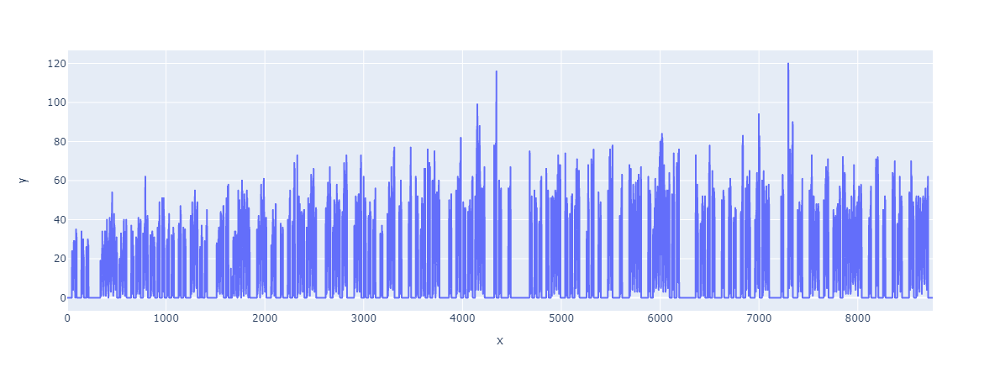

In [301]:
fig = px.line(y=freqs[7])
fig.show()

In [302]:
df = pd.DataFrame()
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = freqs[i]

df['date'] = hours
df.columns.name = 'category'
df = df.set_index('date')

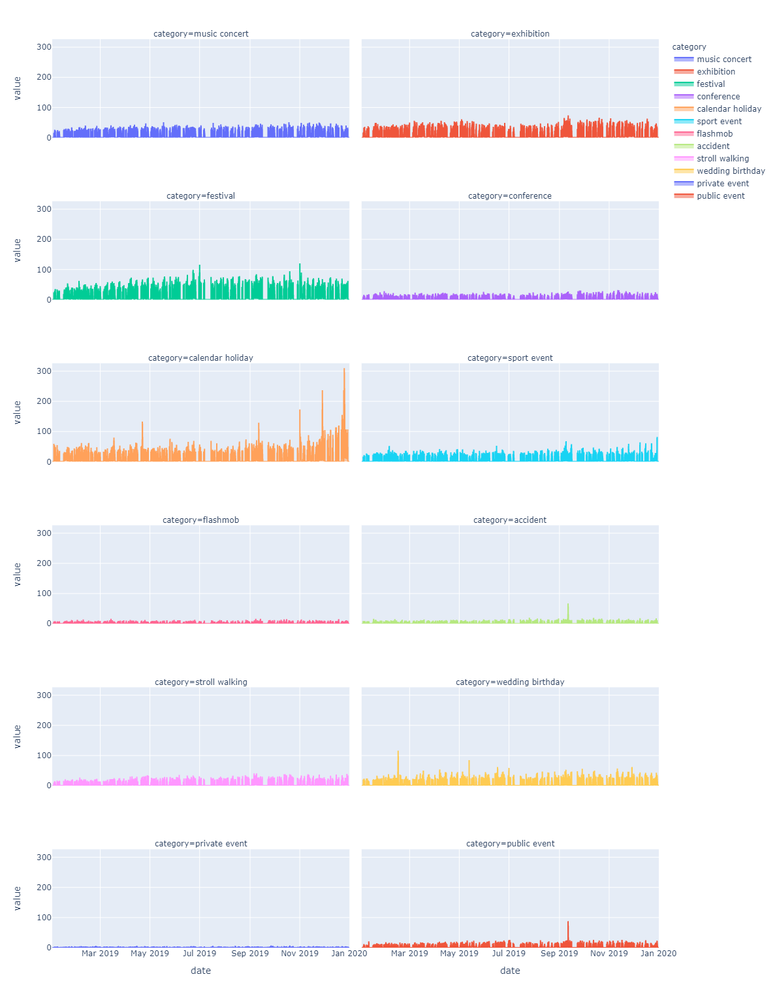

In [303]:
fig = px.area(df, facet_col="category", facet_col_wrap=2, width= 1030, height = 1530)
fig.show()

In [234]:
def avg(mas):
    return sum(mas)/len(mas)

In [257]:
def normalize(x, idx, freqs):
    x = x - int(avg(freqs[idx]))
    if x > 0:
        return x
    return 0

In [254]:
df_backup = df.copy()

In [258]:
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = df[lab].apply(normalize, args=(i,freqs))

In [268]:
#calculate lengths for each surge
def get_surges_lengths(lab):
    lengths = list()
    current_len = 0
    for index, row in df.iterrows(): 
        if row[lab] == 0:
            if current_len != 0:
                lengths.append(current_len)
            current_len = 0
        else:
            current_len += 1
    return lengths

In [271]:
surges_lens = dict()
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    surges_lens[lab] = get_surges_lengths(lab)

In [281]:
for sl in surges_lens:
    print(avg(surges_lens[sl]), '\tis avg len for\t', sl )

10.052307692307693 	is avg len for	 music concert
10.203947368421053 	is avg len for	 exhibition
10.802721088435375 	is avg len for	 festival
7.466836734693878 	is avg len for	 conference
10.271523178807946 	is avg len for	 calendar holiday
9.853968253968254 	is avg len for	 sport event
5.5275735294117645 	is avg len for	 flashmob
6.043032786885246 	is avg len for	 accident
8.943661971830986 	is avg len for	 stroll walking
9.735202492211839 	is avg len for	 wedding birthday
2.5152542372881355 	is avg len for	 private event
7.584134615384615 	is avg len for	 public event


## considering one day as a discrete step

In [329]:
start = time.mktime(time.strptime('2019-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))
finish = time.mktime(time.strptime('2020-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))

days = list()
while(start != finish):
    step = datetime.timestamp(datetime.fromtimestamp(start) + timedelta(hours=24))
    days.append(datetime.fromtimestamp(step))
    start = step

In [330]:
%%time
freqs = list()
for lab in candidate_labs:
    freqs.append( get_number_for_each(df_cut[df_cut.label == lab], 24) )

CPU times: user 5.16 s, sys: 6.87 ms, total: 5.17 s
Wall time: 5.19 s


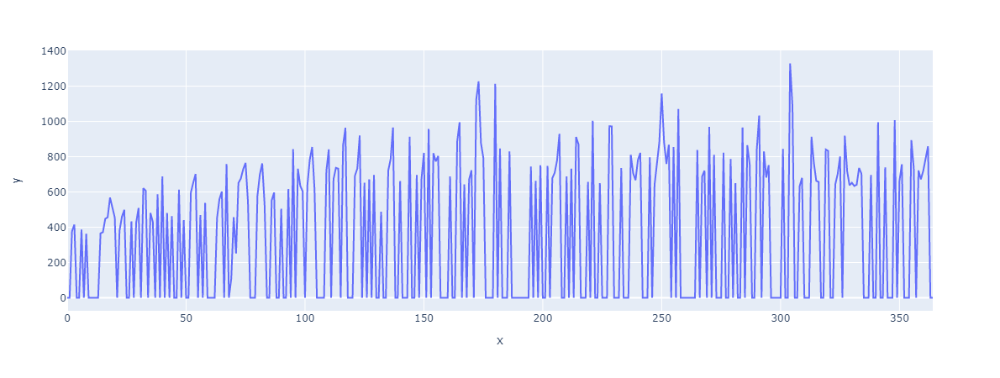

In [331]:
fig = px.line(y=freqs[7])
fig.show()

In [332]:
df = pd.DataFrame()
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = freqs[i]

df['date'] = days
df.columns.name = 'category'
df = df.set_index('date')

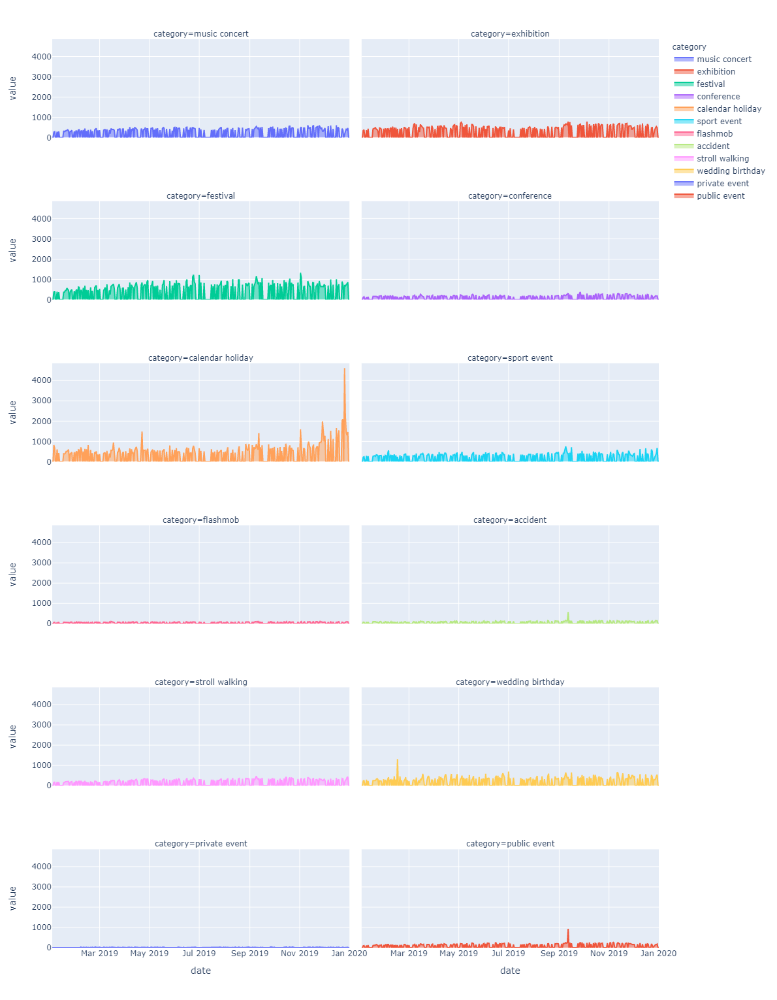

In [333]:
fig = px.area(df, facet_col="category", facet_col_wrap=2, width= 1030, height = 1530)
fig.show()

In [334]:
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = df[lab].apply(normalize, args=(i,freqs))

In [335]:
surges_lens = dict()
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    surges_lens[lab] = get_surges_lengths(lab)

In [336]:
for sl in surges_lens:
    print(avg(surges_lens[sl]), '\tis avg len (in days) for\t', sl )

1.894736842105263 	is avg len (in days) for	 music concert
1.9361702127659575 	is avg len (in days) for	 exhibition
1.9052631578947368 	is avg len (in days) for	 festival
1.9361702127659575 	is avg len (in days) for	 conference
1.9148936170212767 	is avg len (in days) for	 calendar holiday
1.894736842105263 	is avg len (in days) for	 sport event
1.9361702127659575 	is avg len (in days) for	 flashmob
1.894736842105263 	is avg len (in days) for	 accident
1.9052631578947368 	is avg len (in days) for	 stroll walking
1.9052631578947368 	is avg len (in days) for	 wedding birthday
1.831578947368421 	is avg len (in days) for	 private event
1.925531914893617 	is avg len (in days) for	 public event


## 12 hours as a discrete step

In [313]:
start = time.mktime(time.strptime('2019-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))
finish = time.mktime(time.strptime('2020-01-01 00:00:00', "%Y-%m-%d %H:%M:%S"))

days = list()
while(start != finish):
    step = datetime.timestamp(datetime.fromtimestamp(start) + timedelta(hours=12))
    days.append(datetime.fromtimestamp(step))
    start = step

In [315]:
%%time
freqs = list()
for lab in candidate_labs:
    freqs.append( get_number_for_each(df_cut[df_cut.label == lab], 12) )

CPU times: user 8.77 s, sys: 16.6 ms, total: 8.78 s
Wall time: 8.8 s


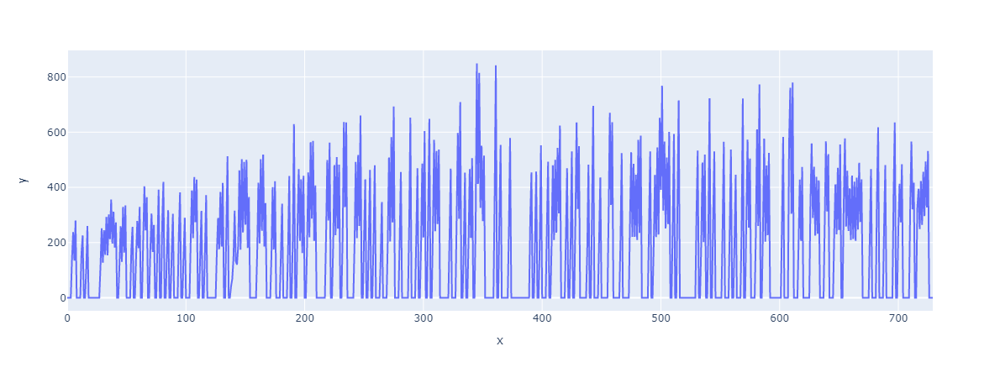

In [316]:
fig = px.line(y=freqs[7])
fig.show()

In [317]:
df = pd.DataFrame()
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = freqs[i]

df['date'] = days
df.columns.name = 'category'
df = df.set_index('date')

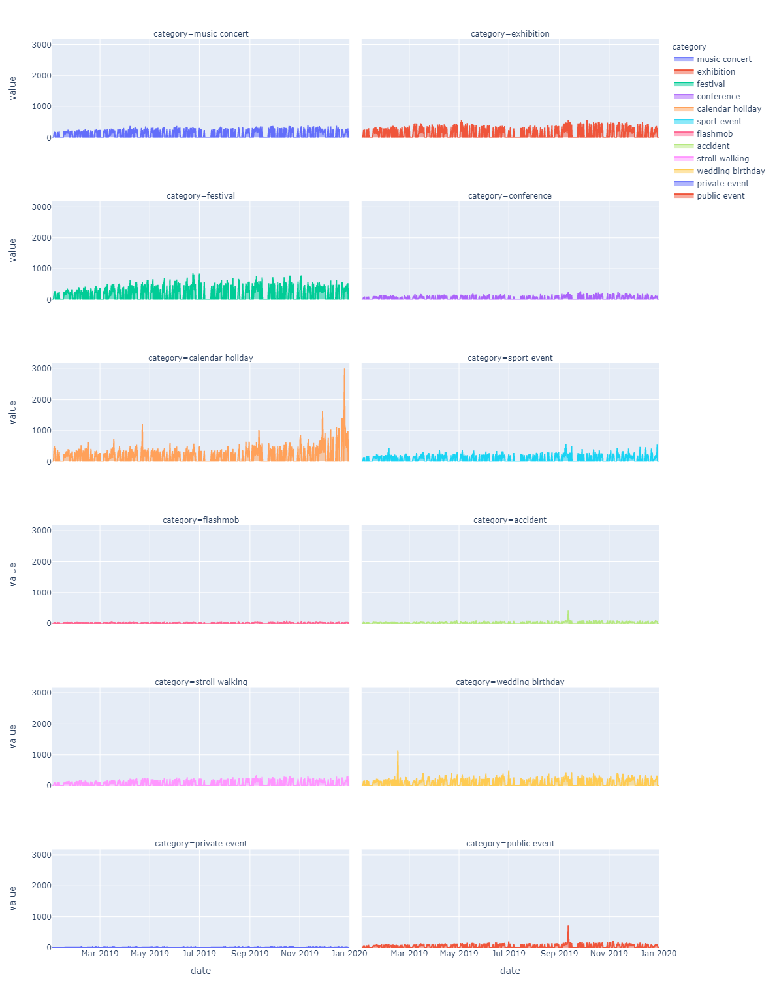

In [318]:
fig = px.area(df, facet_col="category", facet_col_wrap=2, width= 1030, height = 1530)
fig.show()

In [322]:
for i, lab in enumerate(candidate_labs):
    if i < 5:
        continue
    df[lab] = df[lab].apply(normalize, args=(i,freqs))

In [328]:
for sl in surges_lens:
    print(avg(surges_lens[sl])*2, '\tis avg len (in days) for\t', sl )

6.891089108910891 	is avg len (in days) for	 music concert
5.530434782608696 	is avg len (in days) for	 exhibition
6.226415094339623 	is avg len (in days) for	 festival
4.5271317829457365 	is avg len (in days) for	 conference
4.166666666666667 	is avg len (in days) for	 calendar holiday
6.4423076923076925 	is avg len (in days) for	 sport event
5.5 	is avg len (in days) for	 flashmob
5.732142857142857 	is avg len (in days) for	 accident
5.401709401709402 	is avg len (in days) for	 stroll walking
6.457142857142857 	is avg len (in days) for	 wedding birthday
3.9705882352941178 	is avg len (in days) for	 private event
5.51304347826087 	is avg len (in days) for	 public event
